# Cardiovascular Diseases Report

## Introduction 
Cardiovascular diseases (CVDs) are the leading cause of death globally, taking an estimated 17.9 million lives each year [1]. CVDs are a group of disorders of the heart and blood vessels and include coronary heart disease, cerebrovascular disease, rheumatic heart disease and other conditions [1]. More than four out of five CVD deaths are due to heart attacks and strokes, and one third of these deaths occur prematurely in people under 70 years of age [2]. 

This data was taken from [Kaggle](https://www.kaggle.com/datasets/bharath011/heart-disease-classification-dataset) and collects characteristics of Heart Attack or factors that contribute to it. 

In this project, utilizing a database that captures key factors such as gender, age, blood glucose, and blood pressure of participants, we aim to develop a classification model to predict the likelihood of a new patient experiencing a heart attack.

By using a classification model, we would predict the presence of a heart attack based on the main predictors. The question we will be addressing is: **Is a new patient likely to have heart disease, based on age, troponin and kcm?**
 

## Methods
Since the variable “class”, which depicts the presence of a heart attack, is a categorical variable, we choose to conduct our data analysis by classification, specifically by using K nearest neighbors classification algorithm.

To help visualize our results and our predictions, we can plot a scatter plot to help determine what factors contribute to the presence of a heart attack. Select only the columns of data we are interested in using for our prediction.

The columns we will be using are as follows:

1. **age**: age of the patients 
7. **kcm**: amount of specific enzymes(CK-MB) - renamed to **enzyme_amount**
8. **troponin**: Test-Troponin in (ng/L [4])
9. **class**: diagnosis type - negative refers to the absence of a heart attack, while positive refers to the presence of a heart attack.

We do a KNN-classification analysis for 3 models: the first model (age,troponin) and the second (age, enzyme_amount) leverage two predictors, while third model (age,troponin and enzyme_amount) uses all three. 



### Preliminary exploratory data analysis

To proceed with our project in R and Jupyter Notebook, we loaded the necessary packages/libraries, to use the necessary functions.

In [1]:
# Install required packages if not already installed
if (!requireNamespace("GGally", quietly = TRUE)) install.packages("GGally")
if (!requireNamespace("ISLR", quietly = TRUE)) install.packages("ISLR")

# Load the packages
library(tidyverse)
library(repr)
library(tidymodels)
library(GGally)
library(ISLR)

# Set options
options(repr.matrix.max.rows = 6)


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.4     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── t

### Loading data from the web

To read the dataset from the web, we uploaded to Github manually and use the `read_csv` function into the notebook, then store it as a data frame.

In [2]:
url = "https://raw.githubusercontent.com/l-glucose/dsci100/main/data/heart_attack.csv"
raw_data <- read_csv(url, show_col_types = FALSE)
raw_data

age,gender,impluse,pressurehight,pressurelow,glucose,kcm,troponin,class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
64,1,66,160,83,160,1.80,0.012,negative
21,1,94,98,46,296,6.75,1.060,positive
55,1,64,160,77,270,1.99,0.003,negative
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
45,1,85,168,104,96,1.24,4.250,positive
54,1,58,117,68,443,5.80,0.359,positive
51,1,94,157,79,134,50.89,1.770,positive


First, using the `ggpairs` library create a pairplot (also called "scatter plot matrix") of all the columns from the dataset to see the relationship between the response variables`class` and the other variables, then choose some proper variables as the predictors.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwid

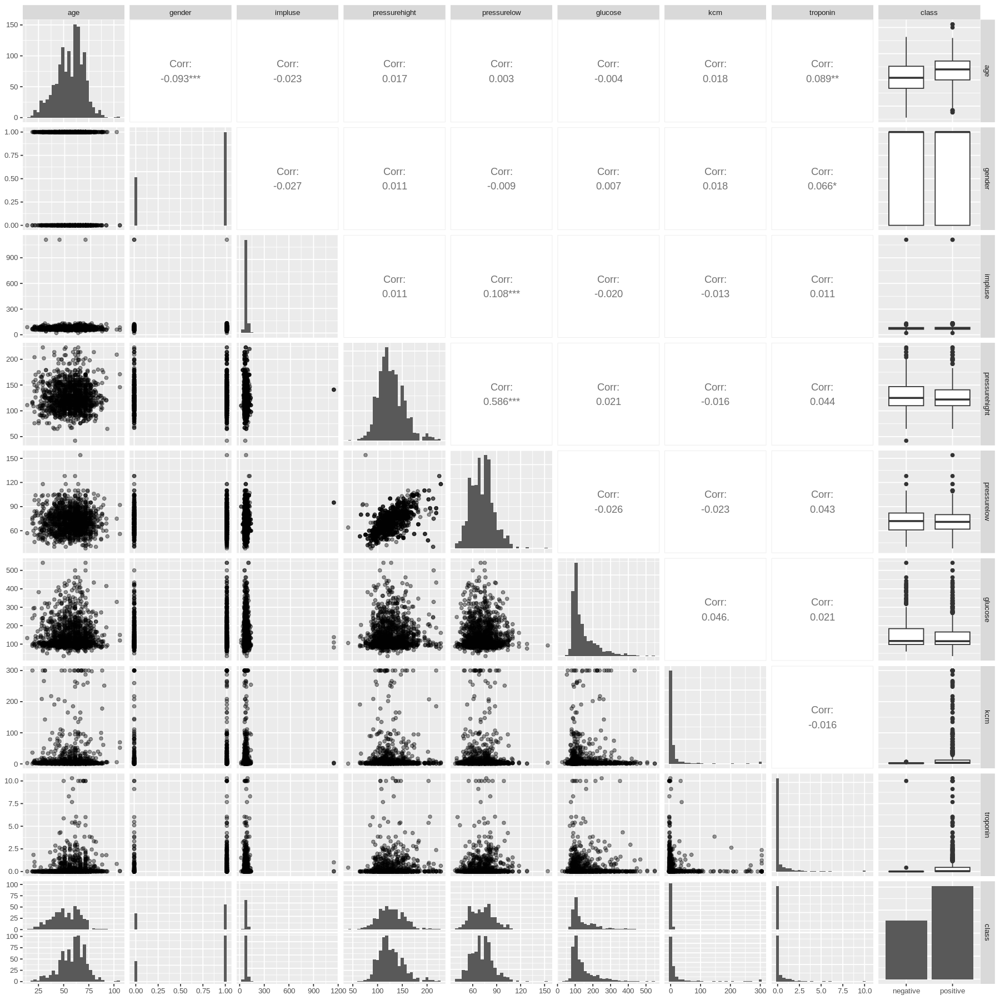

In [3]:
options(repr.plot.height = 15, repr.plot.width = 15) # Modifies the size of the plots
pairplot <- raw_data |> 
    ggpairs(
        lower = list(continuous = wrap('points', alpha = 0.4)),
        diag = list(continuous = "barDiag")
    ) +
    theme(text = element_text(size = 10))
pairplot
options(repr.plot.height = 7, repr.plot.width = 8)


Presenting a ggpair plot helps determine what ideal predictors to use in our model. In this case, troponin and kcm 
represent the best choice of predictors in this data set.

Now, we want have our data in a tidy fort. Select only the columns of data as predictors: `age`, `enzyme_amount`, `troponin`, and `class`, then mutate `class` as a factor.

In [4]:
# Mutating the target column "class" to be a factor
data <- raw_data |> mutate(class = as_factor(class))

# Tidying the data by renaming columns and removing NA values
data_tidy <- data |>
  rename(
    pressure_high = pressurehight,
    pressure_low = pressurelow,
    impulse = impluse,
    enzyme_amount = kcm) |> filter(impulse <= 200) |> drop_na() 


# Selecting the nessesary columns 
trial <- select(data_tidy, age, troponin, enzyme_amount, class)

trial |> head(5)

age,troponin,enzyme_amount,class
<dbl>,<dbl>,<dbl>,<fct>
64,0.012,1.80,negative
21,1.060,6.75,positive
55,0.003,1.99,negative
64,0.122,13.87,positive
55,0.003,1.08,negative


**Table 1.** Sample of dataset with the chosen predictors

Before we perform exploratory data analysis, we should create our training and testing data sets. First, split the `trial` data set. Use 75% of the data and set the variables we want to predict as the `strata` argument. 

In [6]:
set.seed(1000)
trial_split <- initial_split(trial, prop = 0.75, strata = class)
trial_train <- training(trial_split)
trial_test <- testing(trial_split) 

We group the data by the `class` variable, calculate the count of each group, and then add a new column `percent` representing the percentage of each class in the total number of rows in the `trial_train` dataset.

In [8]:
trial_proportions <- trial_train |>
                      group_by(class) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(trial_train))

By summarizing `mean_age`, `mean_troponin`,`mean_enzyme`, we can see a notable difference in mean values for different `class` factors, which signify that they will be separated clearly in scatter plots

In [16]:
mean_statistics <- trial_train |>
              group_by(class) |>
              summarize(mean_age = mean(age), mean_troponin= mean(troponin),mean_enzyme=mean(enzyme_amount))

mean_statistics

class,mean_age,mean_troponin,mean_enzyme
<fct>,<dbl>,<dbl>,<dbl>
negative,52.25197,0.00660105,2.516367
positive,58.98350,0.57337459,24.294477


The plot visualizes the relationship between the variables `age` and `troponin` from the `trial_train` dataset, with points colored by the `class` variable. The x-axis (age) and y-axis (troponin) are displayed in logarithmic scales. The plot is given a title ("Figure 1: Age (years) vs. Troponin (ng/L)"), axis labels, and a specified color legend for the "class" variable. Additionally, the text size in the plot is set to 20 for better readability.

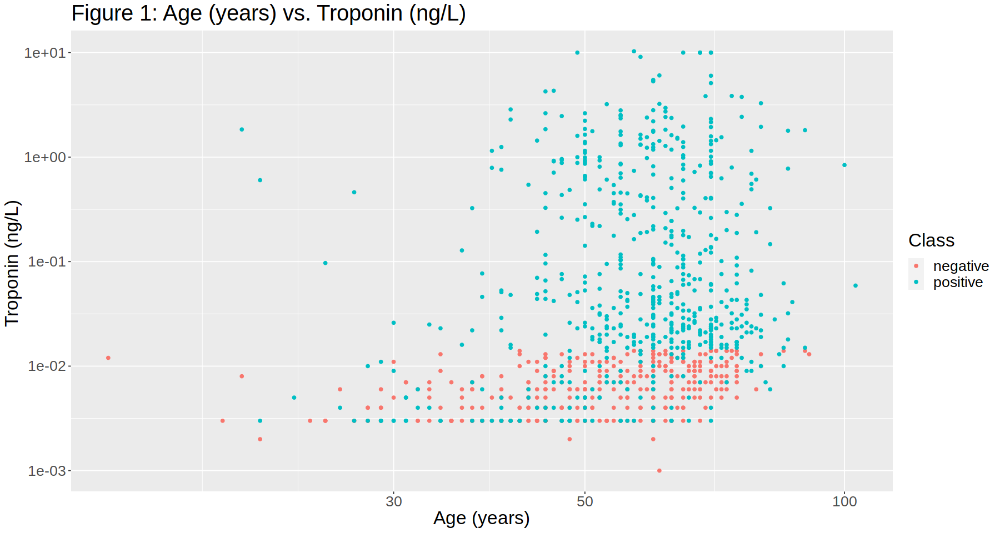

In [12]:
options(repr.plot.width=15, repr.plot.height=8) # Modifies the size of the plots
age_troponin_chart <- trial_train |>
                           ggplot(aes(x=age, y=troponin, color=class)) + 
                           geom_point() + ggtitle("Figure 1: Age (years) vs. Troponin (ng/L)") + 
                           labs(x="Age (years)", y="Troponin (ng/L) ", color="Class") + scale_x_log10() + scale_y_log10() + theme(text = element_text(size = 20))

age_troponin_chart

**Figure 1** - Age(years) on the x-axis and Troponin(ng/L) on the y-axis and points of the chart are colored based on the Class factor. From the chart above, we see that there is a separation between 2 categories of classes (positive and negative), therefore we conclude that these parameters are suitable to train the classifier on them.

Similarly, we perform the same process on `enzyme_amount` vs. `age`, colored by `class`

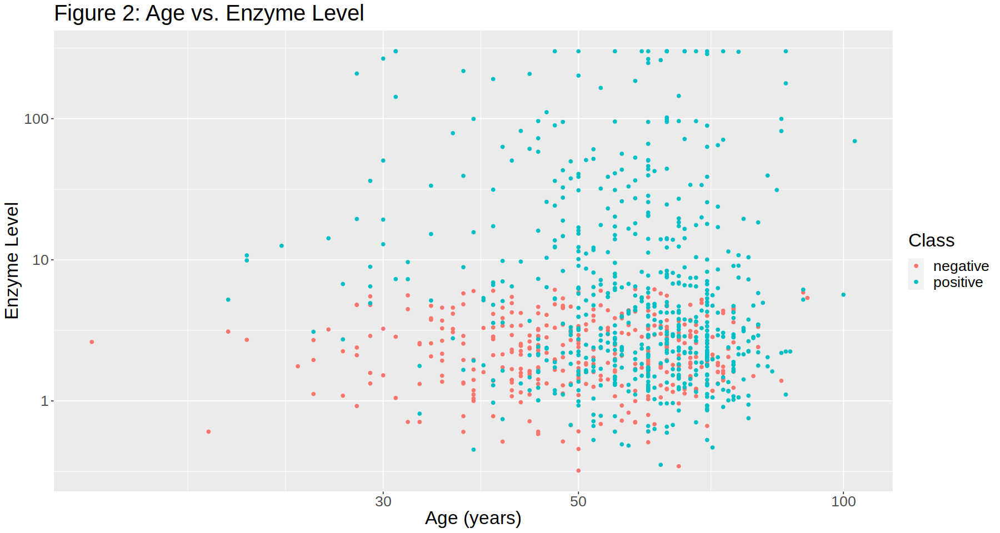

In [13]:
options(repr.plot.width=15, repr.plot.height=8)
age_kcm_chart <- trial_train |>
                           ggplot(aes(x=age, y=enzyme_amount, color=class)) + 
                           geom_point() + ggtitle("Figure 2: Age vs. Enzyme Level") + 
                           labs(x="Age (years)", y="Enzyme Level", color="Class") + scale_x_log10() + scale_y_log10() + theme(text = element_text(size = 20))

age_kcm_chart

**Figure 2** - Age on the x-axis and KCM Enzyme on the y-axis and points of the chart are colored based on the Class factor. From the chart above, we see that there is a separation between 2 categories of classes (positive and negative), thus we conclude that these parameters are suitable to train the classifier on them.

### Model 1: KNN classification (2 parameters: age and troponin)

Then we set a seed, define a recipe for k-nearest neighbors (KNN) classification with `age` and `troponin` as predictors, and then set up a workflow to tune the KNN model using cross-validation. The final part of the code generates a plot (Figure 3) displaying the relationship between the number of neighbors (k values) and the accuracy estimate, based on cross-validation results. The plot is created using ggplot2, with points representing accuracy estimates for different values of k and a line connecting them. Axis labels, a title, and theme adjustments for better visualization are also included in the plot.

In [9]:
set.seed(1000)
trial_recipe_troponin <- recipe(class ~ age + troponin, data = trial_train) |>
                step_scale(all_predictors()) |>
                step_center(all_predictors())
                

knn_spec_tune <- nearest_neighbor(weight_func="rectangular", neighbors=tune()) |>
            set_engine("kknn") |>
            set_mode("classification")

trial_vfold <- vfold_cv(trial_train, v=5, strata=class)

k_vals <- tibble(neighbors=seq(from=1, to=10, by=1))

trial_workflow <- workflow() |>
                  add_recipe(trial_recipe_troponin) |>
                  add_model(knn_spec_tune) |>
                  tune_grid(resamples=trial_vfold, grid=k_vals) |>
                  collect_metrics()

model_1_accuracies <- trial_workflow |> 
      filter(.metric=='accuracy')
model_2_cross_val_plot <- ggplot(accuracies, aes(x = neighbors, y = mean))+
      geom_point() +
      geom_line() +
      labs(x = "Neighbors", y = "Accuracy Estimate") +
      ggtitle("Figure 3: k vs accuracy (2 predictors)") + 
      scale_x_continuous(breaks = seq(0, 10, by = 1)) +
      scale_y_continuous(limits = c(0.4, 1.0)) + theme(text = element_text(size = 20))

model_2_cross_val_plot

ERROR: Error in eval(expr, envir, enclos): object 'accuracies' not found


The code above uses 5-fold cross-validation with neighbors from 1 to 10 to train the KNN classification algorithm to predict the class using age and troponin. Figure 3 displays the accuracy on the y-axis and the number of neighbors on the x-axis. Since the accuracy stays almost equal after k=6, we choose k=6 as the final number of neighbors.

In [22]:
k_model_1 <- 6

knn_spec <- nearest_neighbor(weight_func="rectangular", neighbors=k_model_1) |>
            set_engine("kknn") |>
            set_mode("classification")

model_1_fit <- workflow() |>
              add_recipe(trial_recipe_troponin) |>
              add_model(knn_spec) |>
              fit(data = trial_train)

model_1_predictions <- predict(model_1_fit , trial_test) |>
      bind_cols(trial_test)

The code below calculate the accuracy metric for a model named "model_1_predictions." It uses the metrics function to evaluate the accuracy by comparing the predicted class (`.pred_class`) with the true class labels (`class`). The result is stored in the "model_1_accuracy" variable. The accuracy metric represents the proportion of correctly predicted instances out of the total instances in the dataset.

In [19]:
model_1_accuracy <- model_1_predictions |>
                            metrics(truth = class, estimate = .pred_class)    
model_1_accuracy

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.7872340
kap,binary,0.5782669


Then, we generate a confusion matrix for a model named "model_1_conf_mat." It utilizes the `conf_mat` function to create a table that compares the predicted class (`.pred_class`) against the true class labels (`class`) in the "trial_predictions" dataset. The confusion matrix provides a detailed breakdown of the model's classification performance, showing the counts of true positive, true negative, false positive, and false negative instances.

In [23]:
model_1_conf_mat <- trial_predictions |>
                             conf_mat(truth = class, estimate = .pred_class)

model_1_conf_mat

          Truth
Prediction negative positive
  negative      113       45
  positive       14      157

The confusion matrix we provided can be interpreted as follows:

1. True Negative (TN): 113 instances were correctly predicted as negative.
2. False Positive (FP): 45 instances were incorrectly predicted as positive.
3. False Negative (FN): 14 instances were incorrectly predicted as negative.
4. True Positive (TP): 157 instances were correctly predicted as positive.

### Model 2: KNN classification (2 parameters: age and enzymes)

We use the same functions and operations on Model 2 and Model 3.

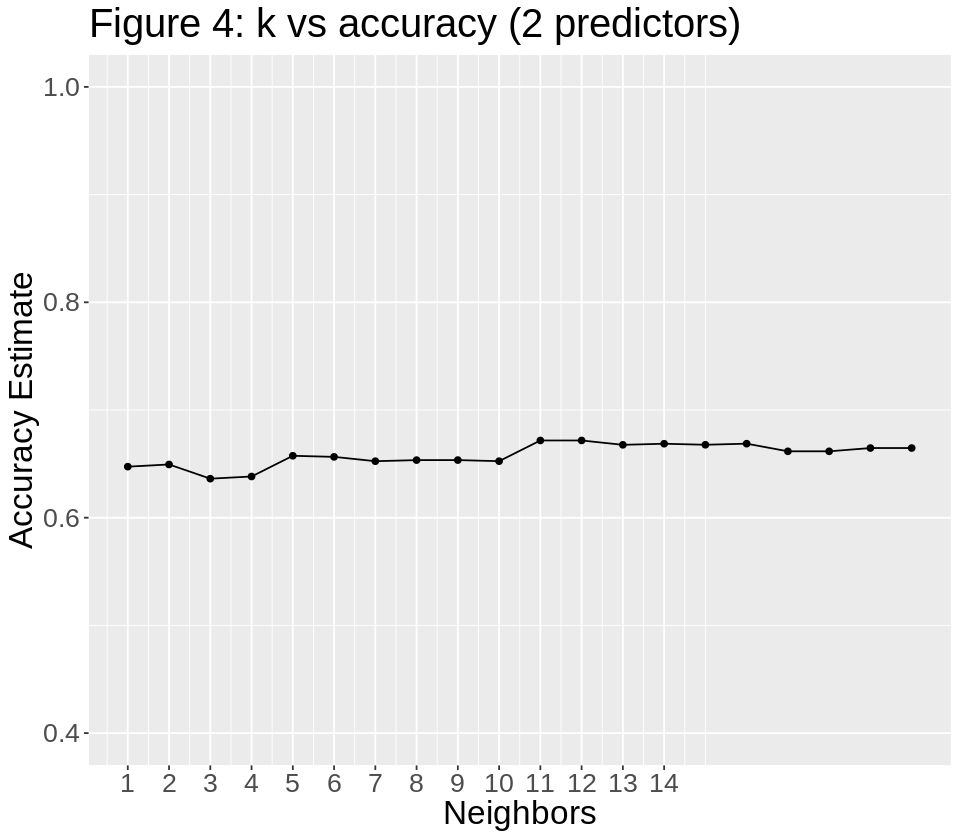

In [24]:
set.seed(1000)
model_2_recipe <- recipe(class ~ age + enzyme_amount, data = trial_train) |>
                step_scale(all_predictors()) |>
                step_center(all_predictors())
                
trial_vfold <- vfold_cv(trial_train, v=5, strata=class)

k_vals <- tibble(neighbors=seq(from=1, to=20, by=1))

trial_workflow <- workflow() |>
                  add_recipe(model_2_recipe) |>
                  add_model(knn_spec_tune) |>
                  tune_grid(resamples=trial_vfold, grid=k_vals) |>
                  collect_metrics()

model_2_accuracies <- trial_workflow |> 
      filter(.metric=='accuracy')

model_2_cross_val_plot <- ggplot(model_2_accuracies, aes(x = neighbors, y = mean))+
      geom_point() +
      geom_line() +
      labs(x = "Neighbors", y = "Accuracy Estimate") +
      ggtitle("Figure 4: k vs accuracy (2 predictors)") + 
      scale_x_continuous(breaks = seq(0, 14, by = 1)) +
      scale_y_continuous(limits = c(0.4, 1.0)) + theme(text = element_text(size = 20))

model_2_cross_val_plot

The code above uses 5-fold cross-validation with neighbors from 1 to 10 to train the KNN classification algorithm to predict the class using age and troponin. Figure 4 displays the accuracy on the y-axis and the number of neighbors on the x-axis. Since the accuracy stays almost equal and greater than others after k=11, we choose k=11 as the final number of neighbors.

In [25]:
model_2_k <- 11

model_2_knn_spec <- nearest_neighbor(weight_func="rectangular", neighbors=model_2_k) |>
            set_engine("kknn") |>
            set_mode("classification")

model_2_fit <- workflow() |>
              add_recipe(model_2_recipe) |>
              add_model(model_2_knn_spec) |>
              fit(data = trial_train)

model_2_predictions <- predict(model_2_fit , trial_test) |>
      bind_cols(trial_test)

In [26]:
trial_prediction_accuracy <- model_2_predictions |>
                            metrics(truth = class, estimate = .pred_class)    
trial_prediction_accuracy

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.6686930
kap,binary,0.2832531


### Model 3: KNN classification (3 parameters: age, enzyme and troponin)

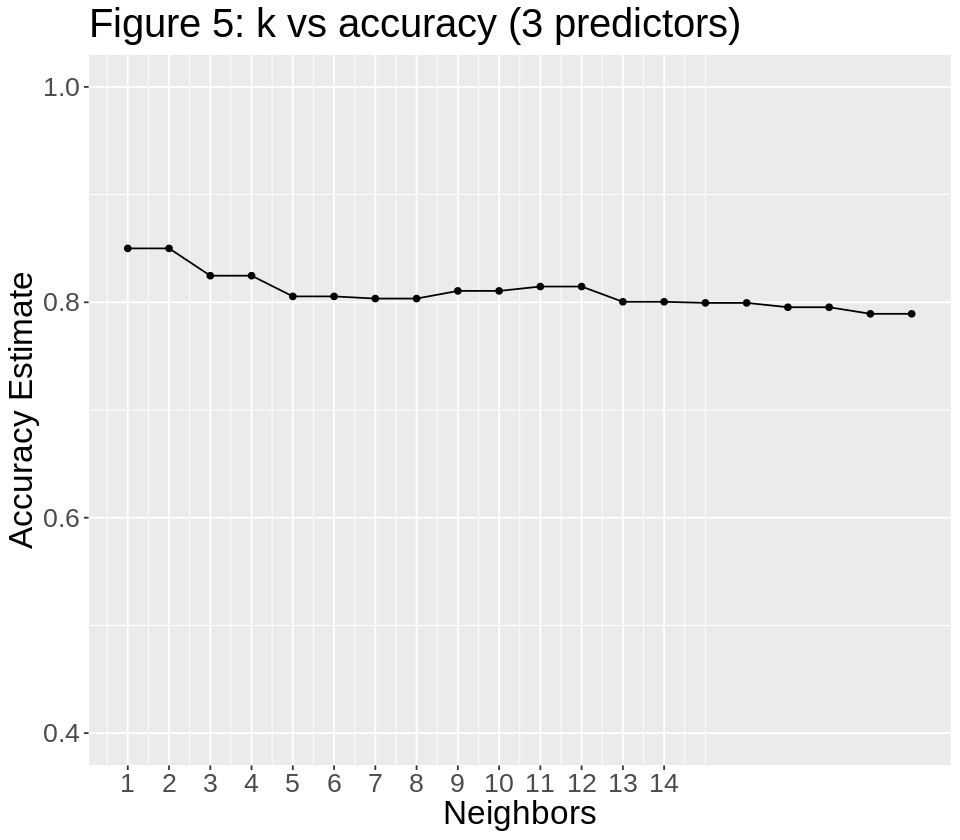

In [10]:
set.seed(1000)
trial_recipe <- recipe(class ~ age+troponin+enzyme_amount, data = trial_train) |>
                step_scale(all_predictors()) |>
                step_center(all_predictors())
                

knn_spec <- nearest_neighbor(weight_func="rectangular", neighbors=tune()) |>
            set_engine("kknn") |>
            set_mode("classification")

trial_vfold <- vfold_cv(trial_train, v=5, strata=class)

k_vals <- tibble(neighbors=seq(from=1, to=20, by=1))

trial_workflow <- workflow() |>
                  add_recipe(trial_recipe) |>
                  add_model(knn_spec) |>
                  tune_grid(resamples=trial_vfold, grid=k_vals) |>
                  collect_metrics()

accuracies <- trial_workflow |> 
      filter(.metric=='accuracy')

cross_val_plot <- ggplot(accuracies, aes(x = neighbors, y = mean))+
      geom_point() +
      geom_line() +
      labs(x = "Neighbors", y = "Accuracy Estimate") +
      ggtitle("Figure 5: k vs accuracy (3 predictors)") + 
      scale_x_continuous(breaks = seq(0, 14, by = 1)) +
      scale_y_continuous(limits = c(0.4, 1.0)) + theme(text = element_text(size = 20))

cross_val_plot

The code above uses 5-fold cross-validation with neighbors from 1 to 10 to train the KNN classification algorithm to predict the class using age and troponin. Figure 5 displays the accuracy on the y-axis and the number of neighbors on the x-axis. Since the accuracy stays almost equal after and greater than others at k=10, we choose k=10 as the final number of neighbors.

In [13]:
k_final <- 10

knn_spec <- nearest_neighbor(weight_func="rectangular", neighbors=k_final) |>
            set_engine("kknn") |>
            set_mode("classification")

trial_fit <- workflow() |>
              add_recipe(trial_recipe) |>
              add_model(knn_spec) |>
              fit(data = trial_train)

trial_predictions <- predict(trial_fit , trial_test) |>
      bind_cols(trial_test)

In [14]:
trial_prediction_accuracy <- trial_predictions |>
                            metrics(truth = class, estimate = .pred_class)    
trial_prediction_accuracy

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.8206687
kap,binary,0.6380773


In [15]:
trial_prediction_conf_mat <- trial_predictions |>
                             conf_mat(truth = class, estimate = .pred_class)

trial_prediction_conf_mat

          Truth
Prediction negative positive
  negative      113       45
  positive       14      157

### Discussion (To be edited)

**Summary of Results:** 
Our analysis revealed significant differences in average Troponin and KCM enzyme levels between patients with positive and negative heart attack diagnosis, while other factors such as blood pressure did not exhibit notable disparities. These findings led us to incorporate Troponin and KCM enzyme levels in our KNN classification models.
Model Evaluation:
-  **Model 1 (Age and Troponin)**: Exhibited a strong correlation between Troponin levels and age in distinguishing heart attack occurrences, with an accuracy of approximately 79% and a false negative rate of 8.2%.


-  **Model 2 (Age and KCM Enzyme)**: Demonstrated a moderate predictive capability, with an accuracy of 67% and a higher false negative rate of 41.8%.


-  **Model 3 (Age, Troponin, and KCM Enzyme)**: Though it improved accuracy to 82%, the model suffered from an increased false negative rate of 28.48%, indicating a trade-off between accuracy and the risk of missing diagnoses.
Model 1 was selected as the most promising due to its high accuracy and relatively low false negative rate. This decision is justified as it provides a balanced approach, prioritizing both the correct identification of heart attacks and minimizing the risk of overlooking potential cases. In a clinical setting, the consequences of false negatives are particularly critical, and thus, a model with a lower false negative rate is preferred even if it sacrifices some accuracy.


About False Negative in the Model:
Model 1 and model 2 were created to help us compare the false positives. A false negative in this context refers to a case where the model incorrectly predicts a patient as not having a heart attack when they actually do. This is a critical aspect of our evaluation, as a high false negative rate could lead to missed diagnoses in clinical settings. It is more dangerous to have a false negative rather than a false positive. 

**Impact and Implications:** 
The ability to predict heart attacks using these models could significantly enhance diagnostic processes in emergency settings, potentially increasing survival rates. The incorporation of these models as auxiliary diagnostic tools, providing rapid assessments based on age and enzyme levels, could aid in timely decision-making. However, the variation in accuracy and false negative rates between models underscores the need for careful consideration in clinical applications.
Advantages and Limitations of KNN in This Context:
KNN classification offers simplicity and efficiency but is constrained by the size and quality of the dataset. The high false negative rates in some models suggest a need for model refinement and possibly exploring alternative or complementary machine learning techniques, such as neural networks for deeper analysis.
Future Directions:

**Future inquiries:** 

-  Can expanding the dataset or employing more complex models like neural networks enhance predictive accuracy and reduce false negatives for heart attack diagnostics?

-  What other physiological or demographic factors could be integrated into the heart attack prediction model to improve its predictive power of KNN classification?

-  How do these models perform in diverse patient populations, and what are the implications for personalized medicine?
In conclusion, our project presents a promising step towards leveraging data classification in cardiac emergency scenarios, though it also highlights the critical balance between model accuracy and clinical applicability. Further research is warranted to optimize these models for real-world medical settings.


### Bibliography 
-  [1] https://www.who.int/health-topics/cardiovascular-diseases
-  [2] https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6011508/
-  [3] https://www.mayoclinic.org/healthy-lifestyle/fitness/expert-answers/heart-rate/faq-20057979#:~:text=A%20normal%20resting%20heart%20rate%20for%20adults%20ranges%20from%2060,function%20and%20better%20cardiovascular%20fitness.
-  [4] https://protocols.sonichealthcare.com/dhm/Troponin.pdf 